In [1]:
#Bibliotecas / Library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import datetime

In [2]:
#definindo o mes / mounth name
mes_nome = 'dezembro'

In [3]:
#Criando o data set a partir do arquivo XLS
# Setup file dataset for each mounth
file = r"939013_12.xls"
df = pd.read_excel(file)
df.head()

WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


,Landis+Gyr Equipamentos de Medição - Programa de Análise de Demanda - PAD Win 4.00.17,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14
0,Data: 01/01/2023 Leitora: 000...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Hora: 00:30:23 Equipamento: 150...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Relatório da memoria de massa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Reg.,Data,Hora,kW,C1,kvarIND,C2,kvarCAP,C3,SH,SR,FPot.,DCR,UFER,NaN


In [4]:
#Organizando o dataset
# Clean dataset
df.drop(df.index[0:4], inplace=True) #excluir o cabeçalho antigo até a linha 4
df = df.reset_index(drop=True) #resetar os índices
df.columns = df.iloc[0] #definir a coluna de índice 0 como novo cabeçalho
df = df[1:] #Excluir a primeira linha, já que definimos o novo cabeçalho
df = df.reset_index(drop = True) #setar os índices
df.head()

,Reg.,Data,Hora,kW,C1,kvarIND,C2,kvarCAP,C3,SH,SR,FPot.,DCR,UFER,NaN
0,3,2023-12-01 00:00:00,00:15:00,199,138,147,102,0,0,F,L,80 L,NaN,NaN,NaN
1,6,2023-12-01 00:00:00,00:30:00,194,135,141,98,0,0,F,L,81 L,NaN,NaN,NaN
2,9,2023-12-01 00:00:00,00:45:00,193,134,143,99,0,0,F,C,80 L,NaN,NaN,NaN
3,12,2023-12-01 00:00:00,01:00:00,189,131,147,102,0,0,F,C,79 L,NaN,NaN,NaN
4,15,2023-12-01 00:00:00,01:15:00,190,132,147,102,0,0,F,C,79 L,NaN,NaN,NaN


In [5]:
#Conversão de dados
#Convert data
df[['kW', 'C1', 'kvarIND', 'C2', 'kvarCAP', 'C3']] = df[['kW', 'C1', 'kvarIND', 'C2', 'kvarCAP', 'C3']].astype('float64')
df['Data'] = pd.to_datetime(df['Data'])
df['Hora'] = pd.to_datetime(df['Hora'], format='%H:%M:%S').dt.time
df.head()

,Reg.,Data,Hora,kW,C1,kvarIND,C2,kvarCAP,C3,SH,SR,FPot.,DCR,UFER,NaN
0,3,2023-12-01,00:15:00,199.0,138.0,147.0,102.0,0.0,0.0,F,L,80 L,NaN,NaN,NaN
1,6,2023-12-01,00:30:00,194.0,135.0,141.0,98.0,0.0,0.0,F,L,81 L,NaN,NaN,NaN
2,9,2023-12-01,00:45:00,193.0,134.0,143.0,99.0,0.0,0.0,F,C,80 L,NaN,NaN,NaN
3,12,2023-12-01,01:00:00,189.0,131.0,147.0,102.0,0.0,0.0,F,C,79 L,NaN,NaN,NaN
4,15,2023-12-01,01:15:00,190.0,132.0,147.0,102.0,0.0,0.0,F,C,79 L,NaN,NaN,NaN


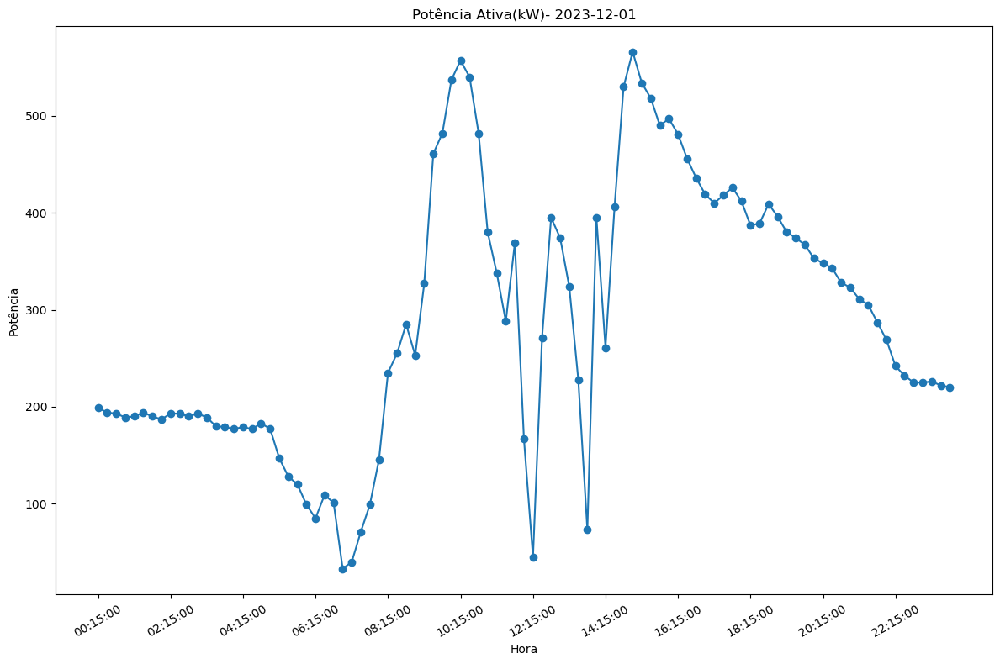

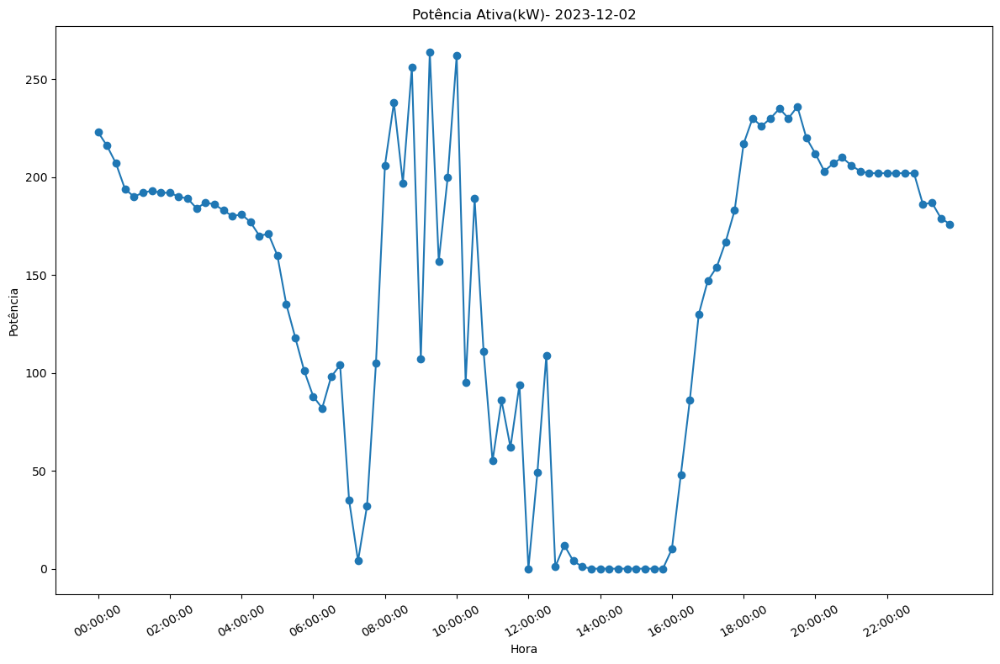

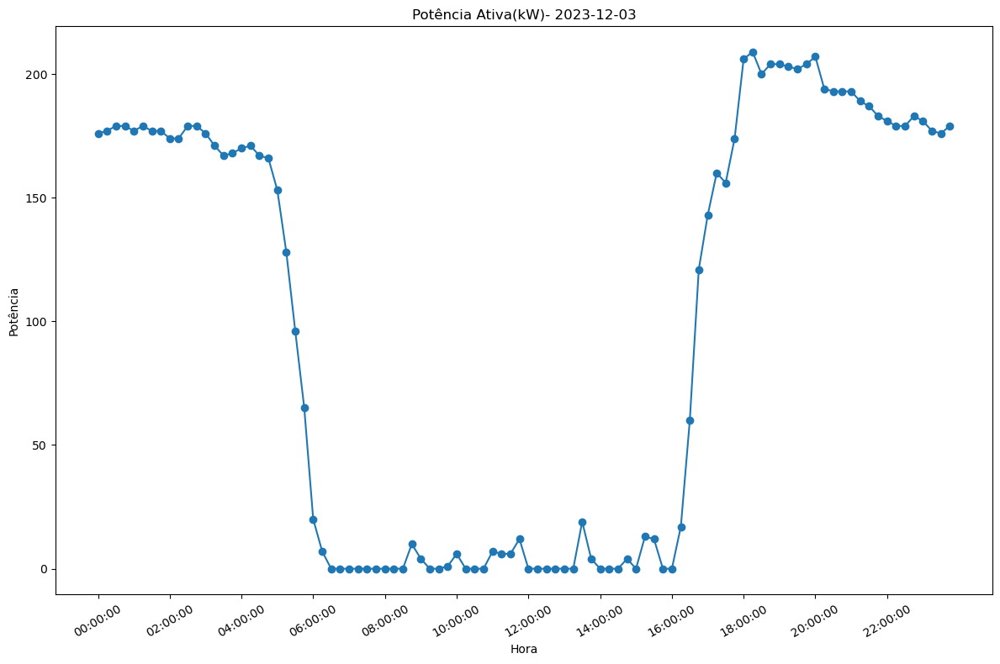

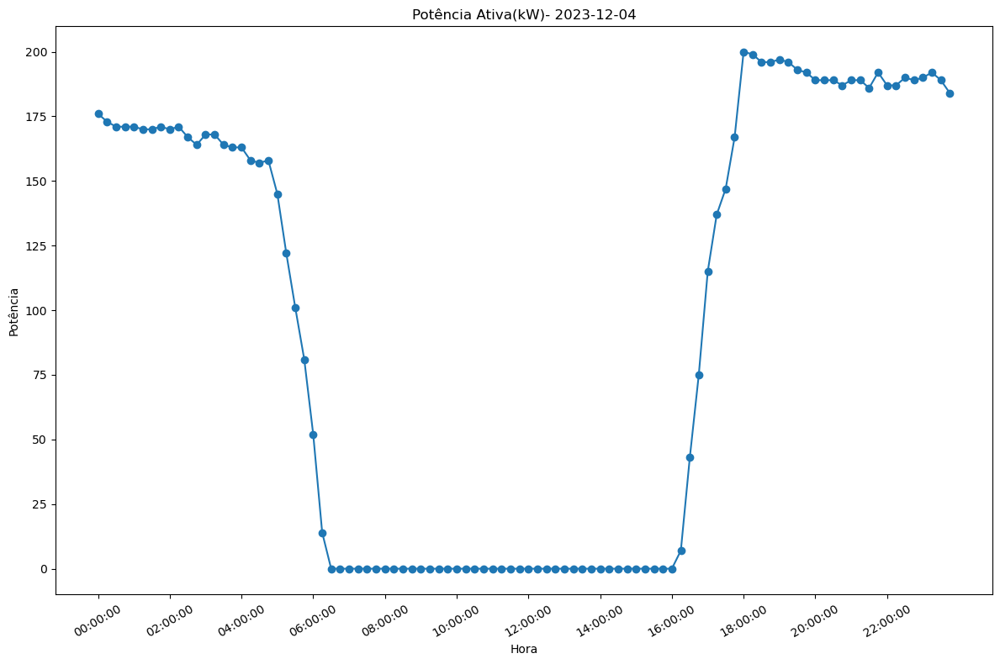

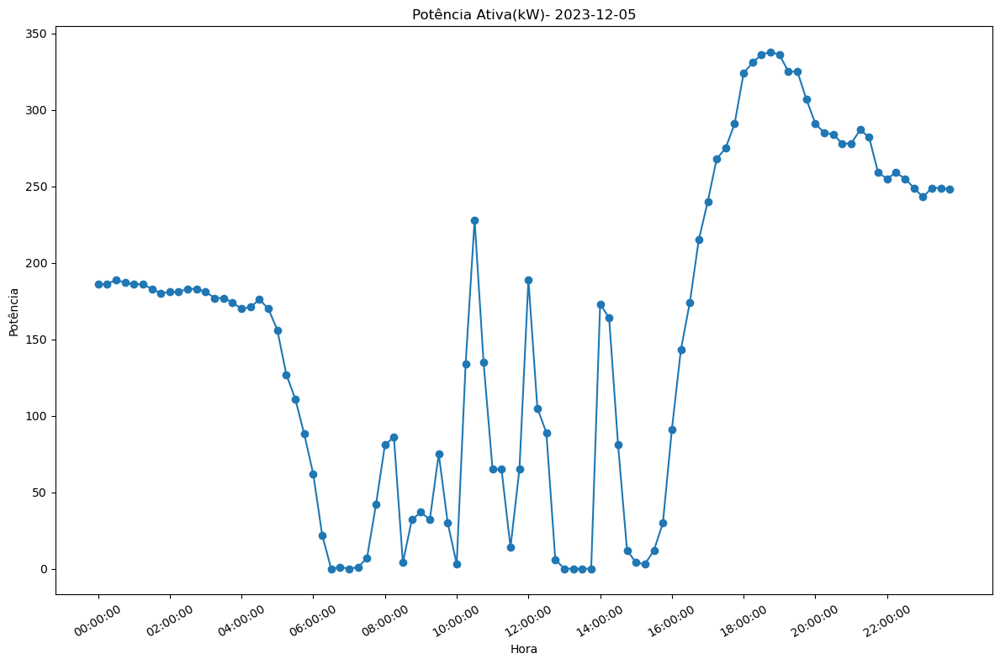

...

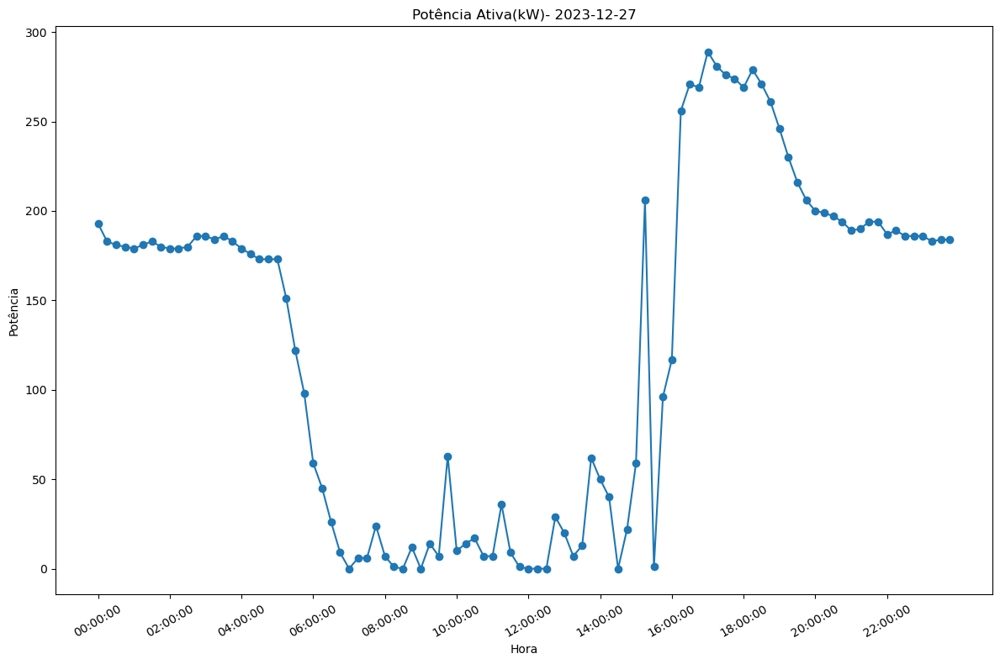

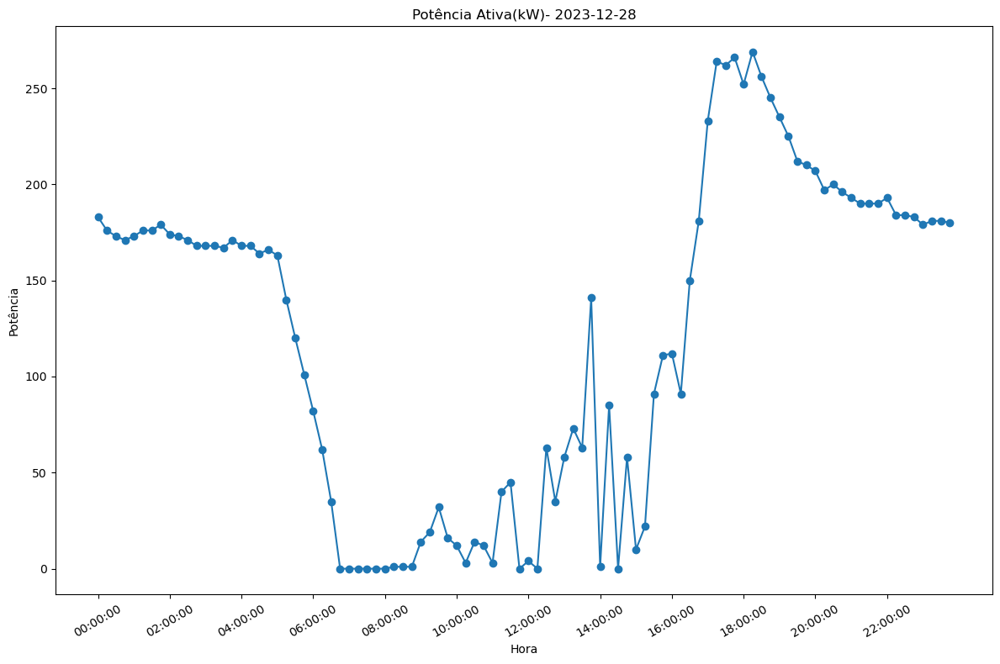

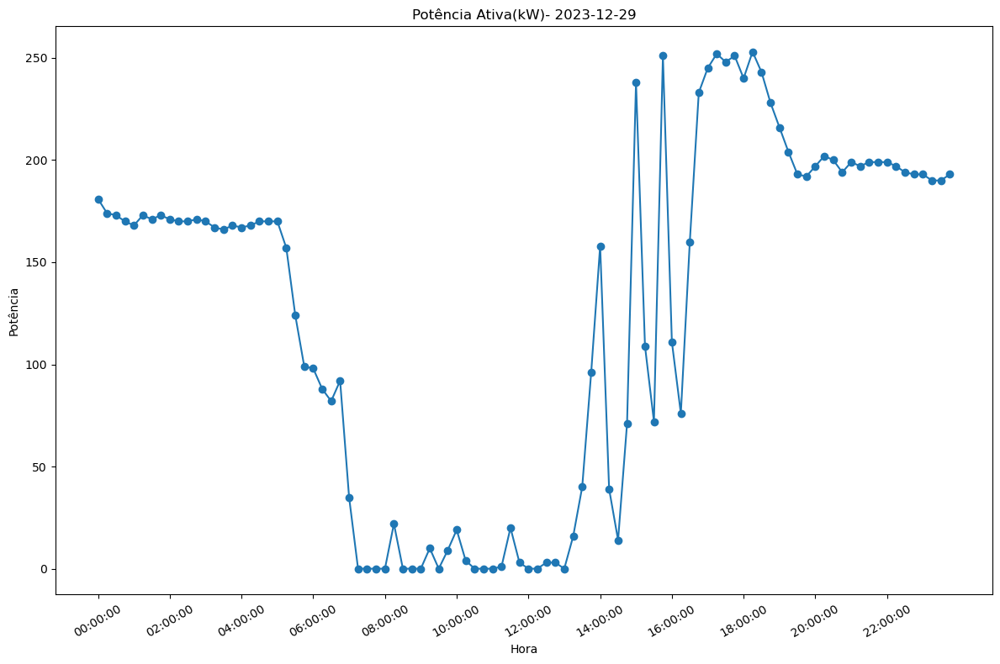

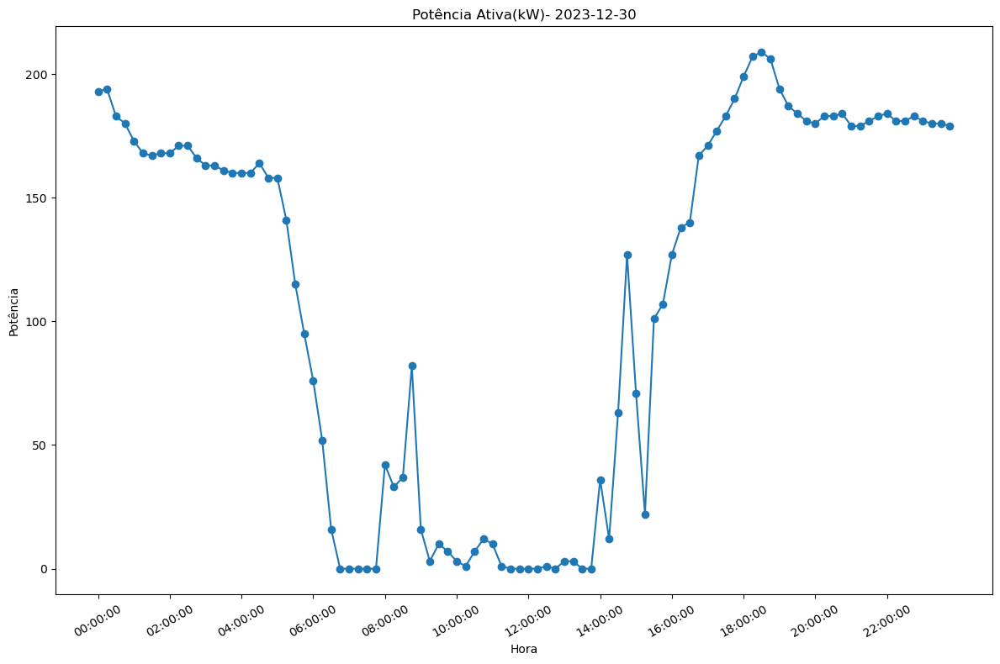

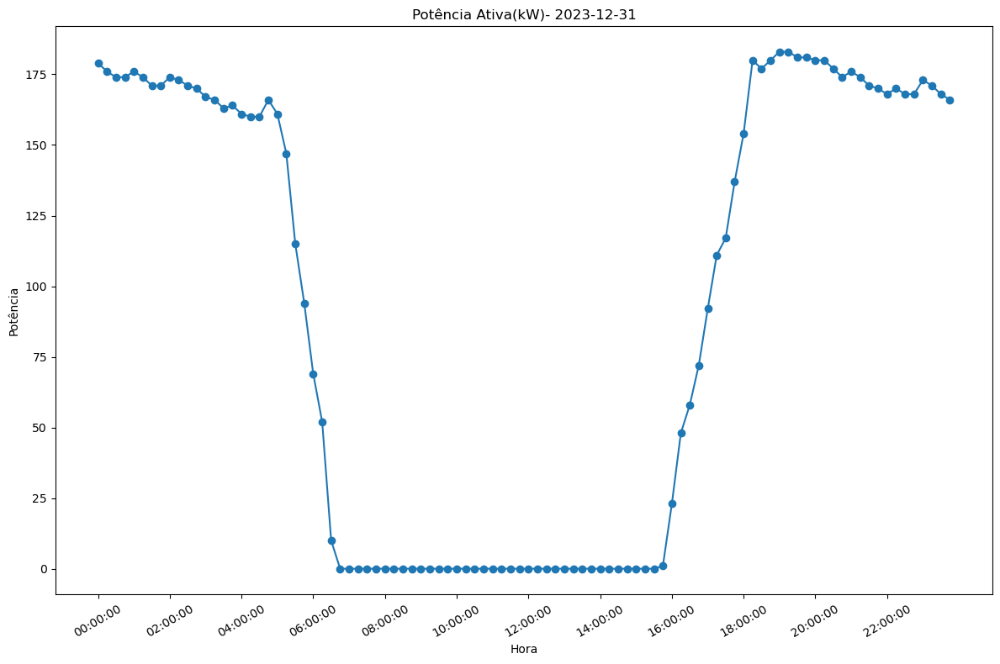

In [6]:
# Salvar cada dia em 1 jpg
# Day per day in jpg

#Criar vetor para armazenar os dias
#Array for index days
pdf_paths = []
pdf_pages = PdfPages('grafico_diadia_{mes_nome}.jpg')

# Iterar sobre os dias do mês
# Iterate for each day
for day in range(1, 32):  # 30 or 31 day
    # Filtrar os dados para o dia atual
    # Filter the data for the current day
    data_set = f'2023-12-{day:02d}'
    def_fill = df[df['Data'] == data_set].copy()
    def_fill['Hora'] = def_fill['Hora'].astype(str)
    
    # Criar uma nova figura
    # Creat figure
    plt.figure(figsize=(12, 8))

    # Plotar a potência x hora
    # Plot Power x Hour
    plt.plot(def_fill['Hora'], def_fill['kW'], marker='o', linestyle='-')
    
    # Configurações do gráfico
    # Config Graph
    plt.xlabel('Hora')
    plt.ylabel('Potência')
    plt.title(f'Potência Ativa(kW)- {data_set}')
    plt.xticks(def_fill['Hora'][::8], rotation=30)  
    
    #Salvar cada gráfico em jpg
    #Save each graph in as one jpg
    pdf_path = f'C:\\Users\\lucas\\Documents\\jupyter_dir_padrao\\eficiencia\\graficosmeses\\{mes_nome}\\DemandaAtiva\\dia_{day:02d}.jpg'
    plt.savefig(pdf_path, format='jpg')
    pdf_paths.append(pdf_path)
      
    # Exibir o gráfico
    # Show Graphics
    plt.tight_layout()
    plt.show()

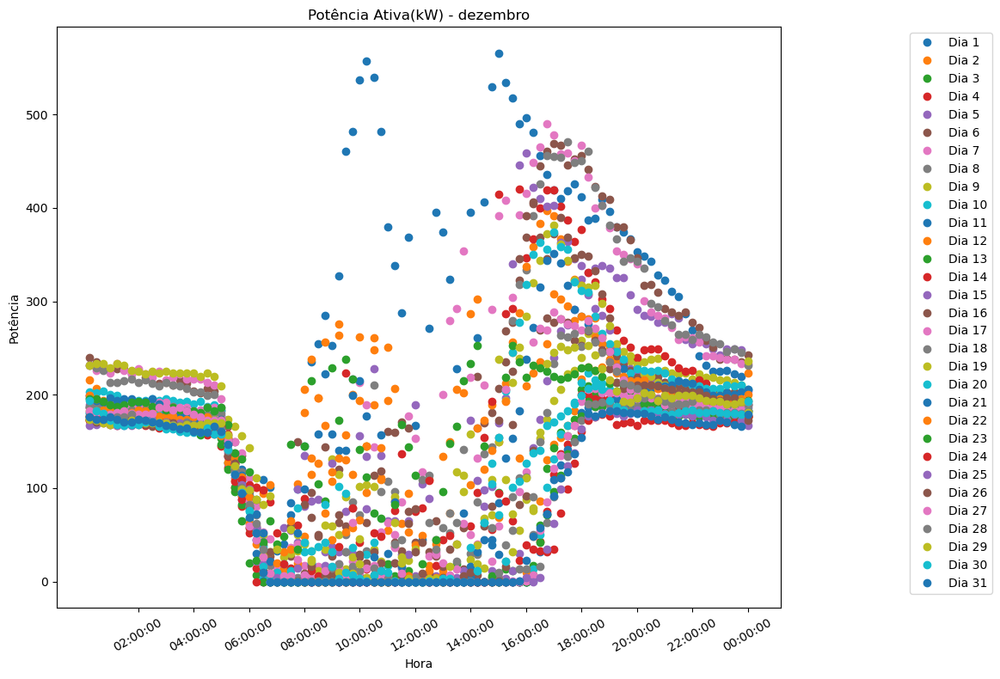

In [7]:
#Todos os dias juntos
#All in one

# Criar uma nova figura
plt.figure(figsize=(12, 8))

# Iterar sobre os dias do mês
for day in range(1, 32): 
    data_set = f'2023-12-{day:02d}'
    def_fill = df[df['Data'] == data_set].copy()
    def_fill['Hora'] = def_fill['Hora'].astype(str)
    
    plt.plot(def_fill['Hora'], def_fill['kW'], label=f'Dia {day}', marker='o', linestyle='None')
    
plt.xlabel('Hora')
plt.ylabel('Potência')
plt.title(f'Potência Ativa(kW) - {mes_nome}')
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
plt.xticks(def_fill['Hora'][::8], rotation=30)

plt.tight_layout()
plt.savefig(f'C:\\Users\\lucas\\Documents\\jupyter_dir_padrao\\eficiencia\\graficosmeses\\{mes_nome}\\DemandaAtiva\\DemandaDiariaTotal_{mes_nome}.jpg')
plt.show()

In [8]:
# Verificar a curva W x Var Ind x Var Cap x Tempo
# Load Curv W x VarInd x VarCap

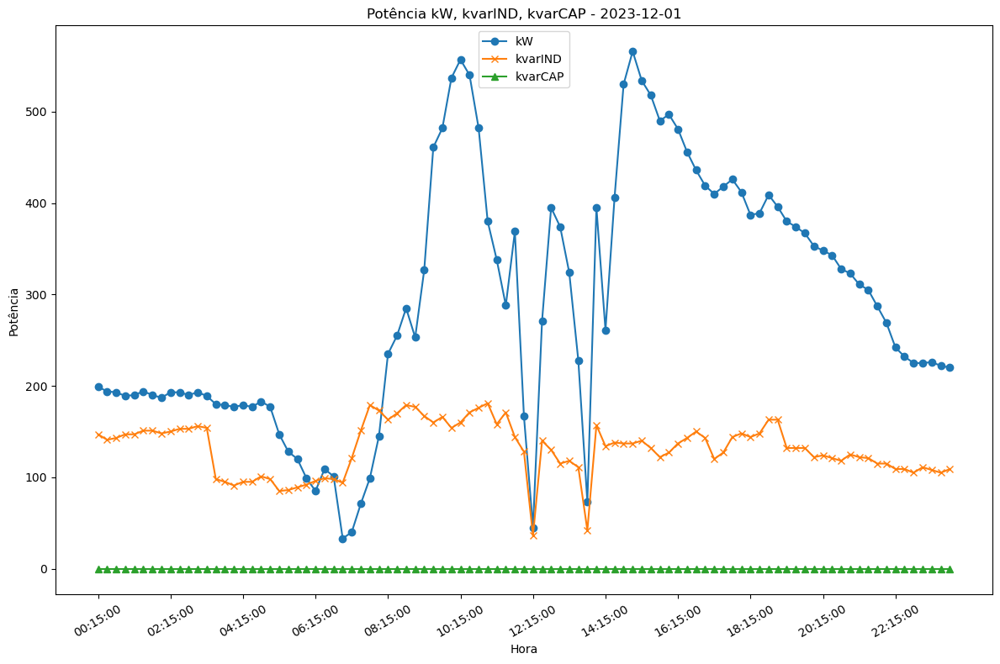

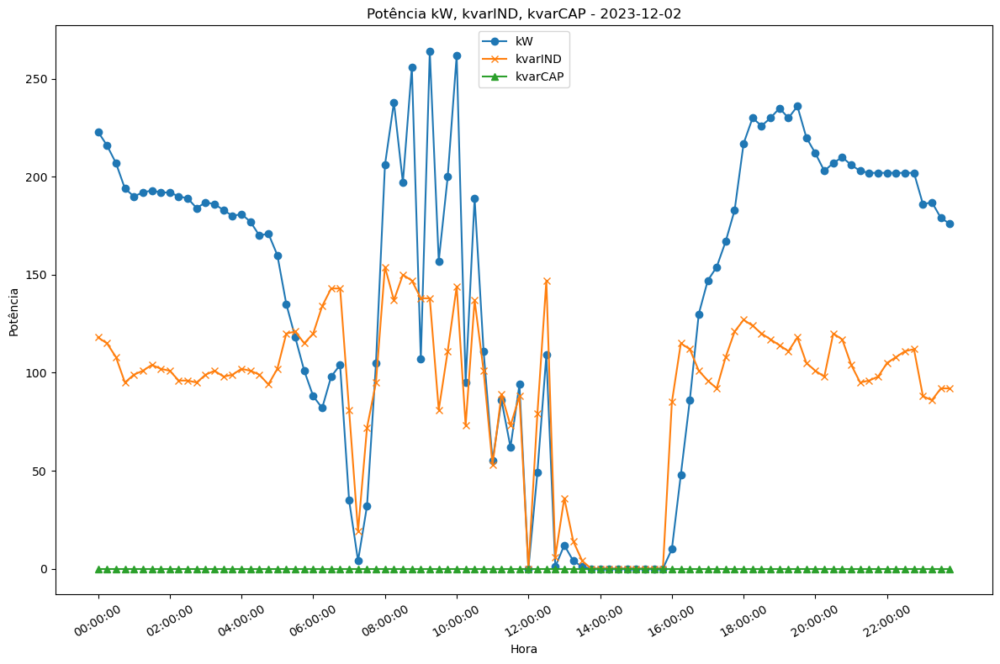

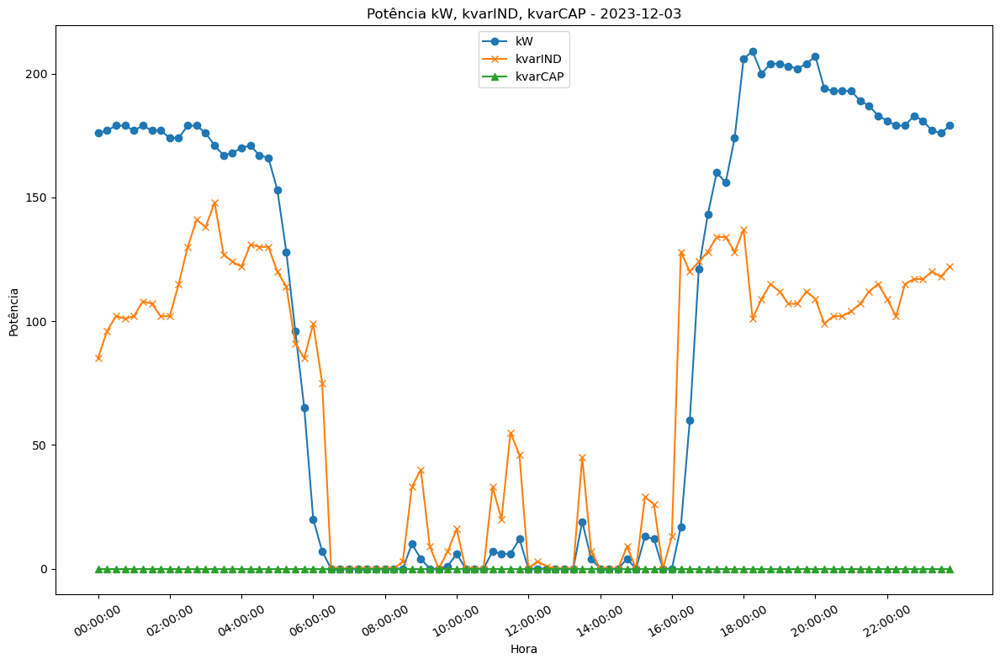

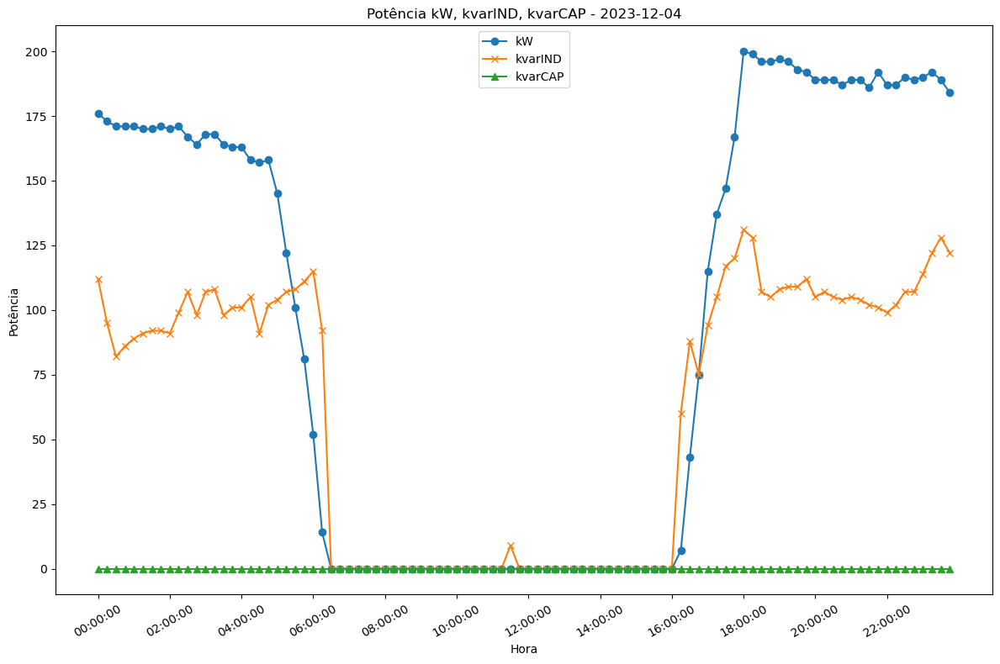

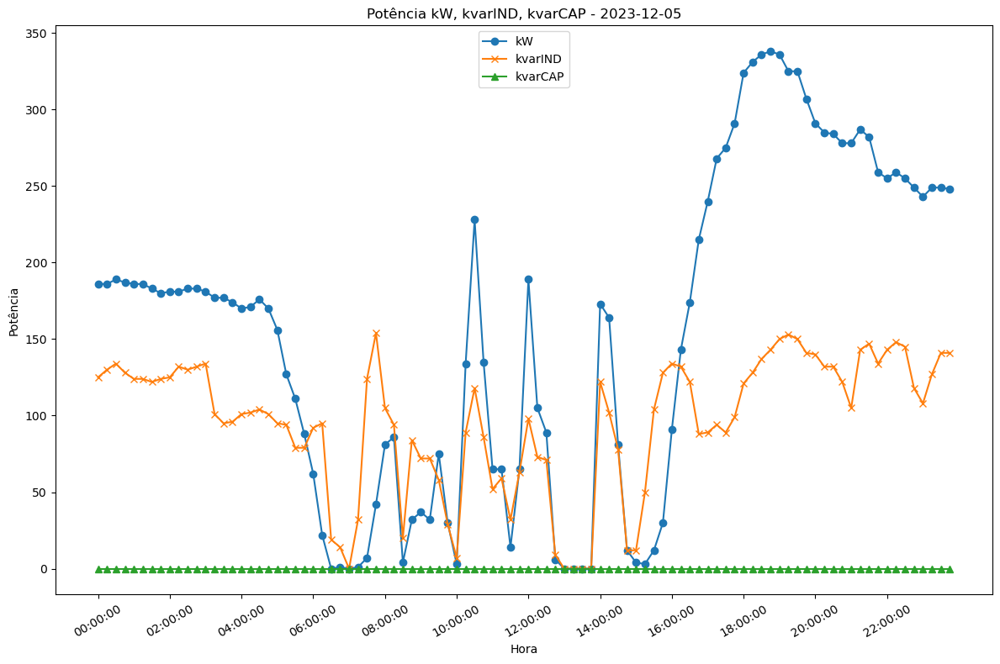

...

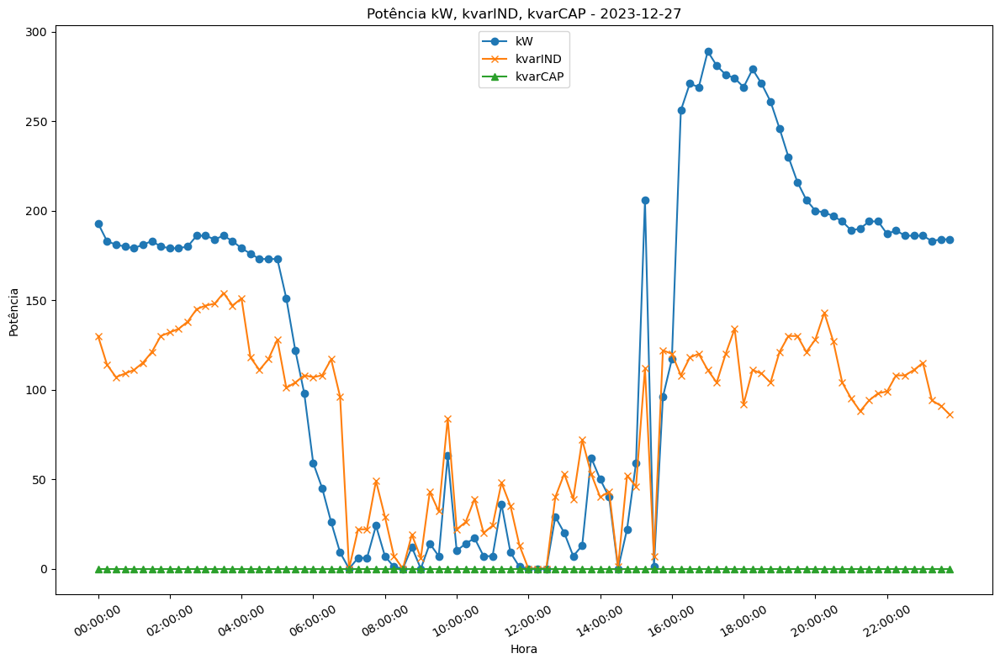

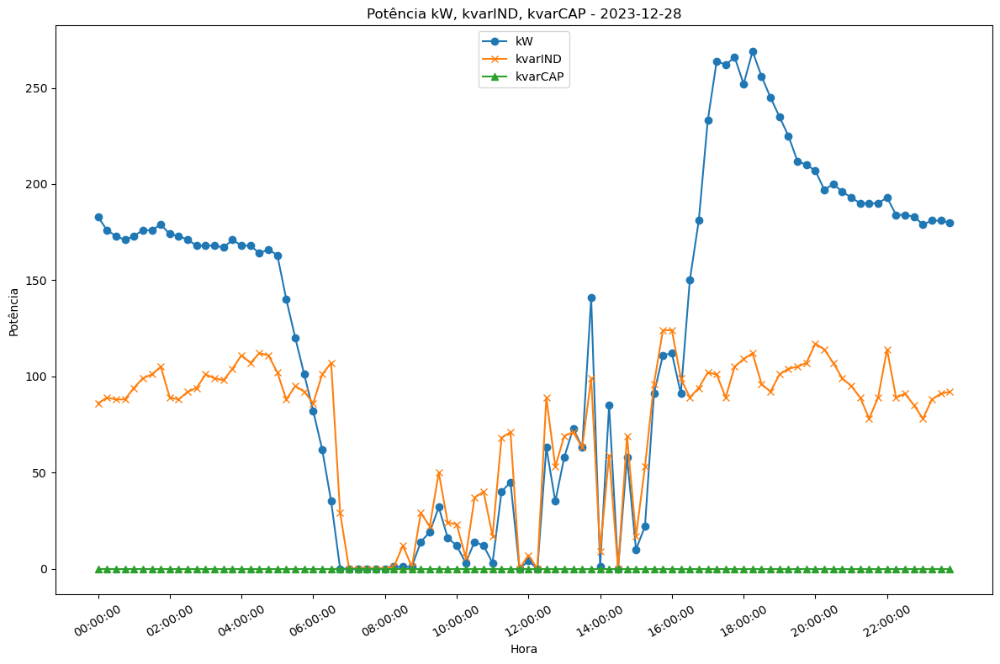

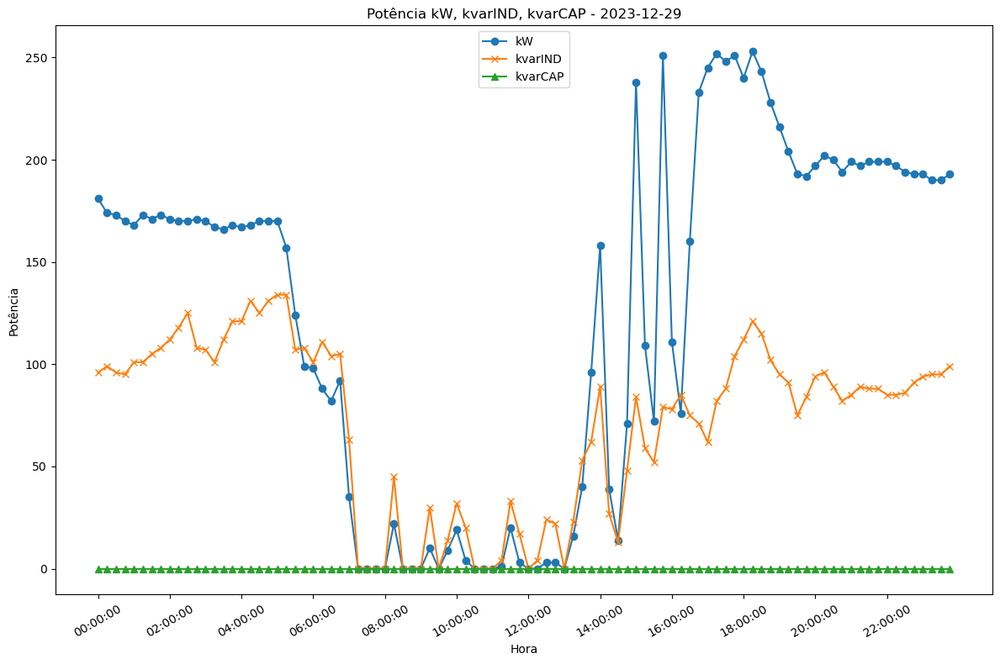

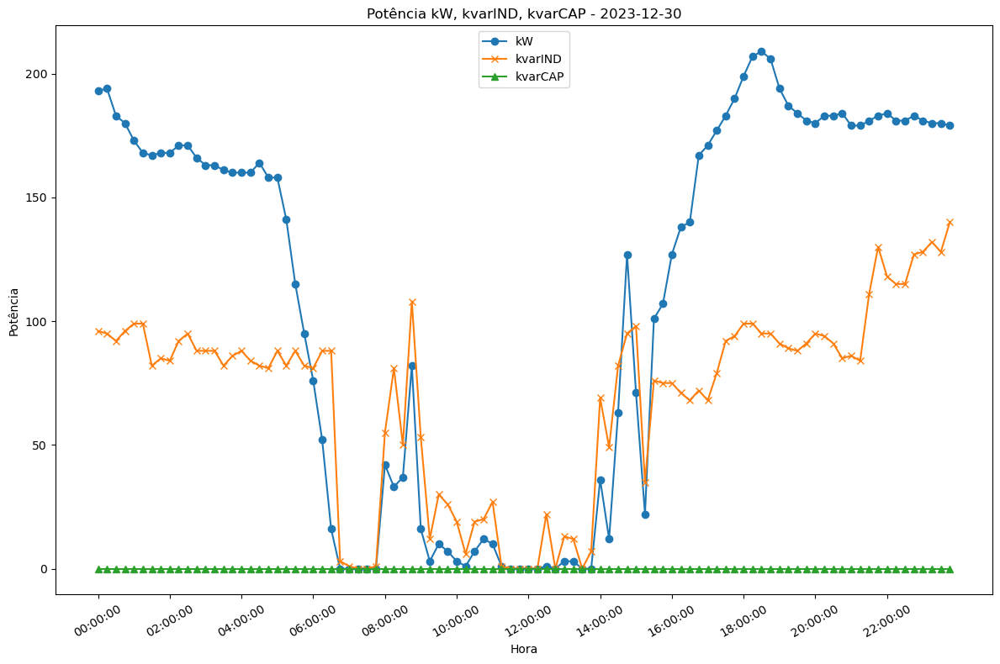

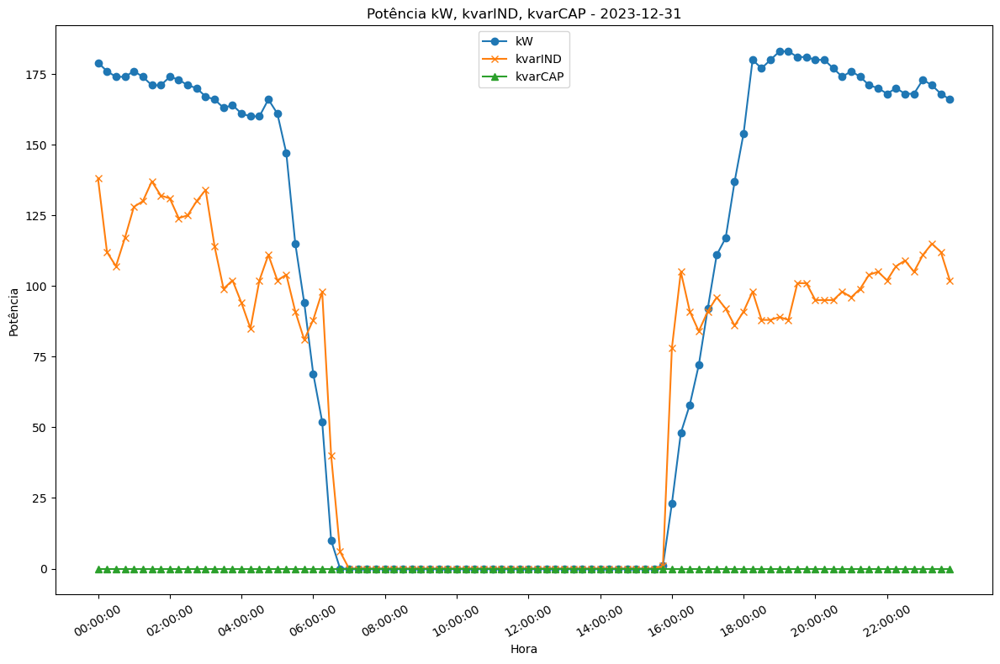

In [10]:
pdf_paths = []
pdf_pages = PdfPages('grafico_Reativo_diadia_{mes_nome}.pdf')

for day in range(1, 32): 
    data_set = f'2023-12-{day:02d}'
    def_fill = df[df['Data'] == data_set].copy()
    df['Hora'] = df['Hora'].astype(str)
    
   
    plt.figure(figsize=(12, 8))

    # Plotar as curvas sobrepostas
    # Plot the overlapping curves
    plt.plot(def_fill['Hora'], def_fill['kW'], marker='o', linestyle='-', label='kW')
    plt.plot(def_fill['Hora'], def_fill['kvarIND'], marker='x', linestyle='-', label='kvarIND')
    plt.plot(def_fill['Hora'], def_fill['kvarCAP'], marker='^', linestyle='-', label='kvarCAP')
    
    plt.xlabel('Hora')
    plt.ylabel('Potência')
    plt.title(f'Potência kW, kvarIND, kvarCAP - {data_set}')
    plt.xticks(def_fill['Hora'][::8], rotation=30)  
    plt.legend(loc='upper center')
    
    
    pdf_path = f'C:\\Users\\lucas\\Documents\\jupyter_dir_padrao\\eficiencia\\graficosmeses\\{mes_nome}\\DemandaReativa\\Reativo_dia_{day:02d}.jpg'
    plt.savefig(pdf_path, format='jpg')
    pdf_paths.append(pdf_path)
    
   
    plt.tight_layout()
    plt.show()

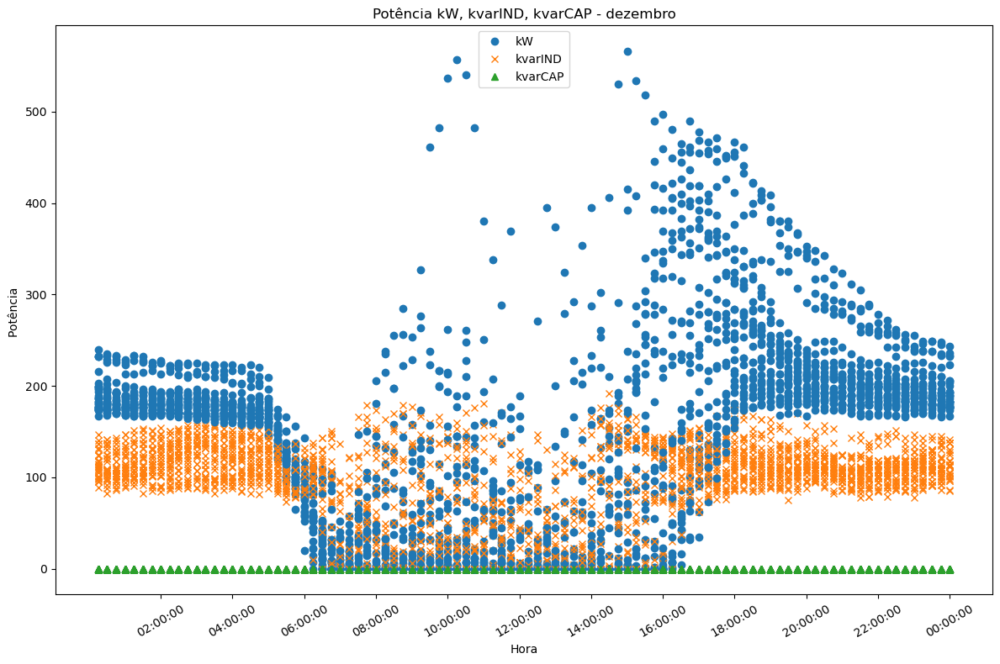

In [11]:
#All in one

plt.figure(figsize=(12, 8))


for day in range(1, 32): 
    data_set = f'2023-12-{day:02d}'
    def_fill = df[df['Data'] == data_set].copy()
    df['Hora'] = df['Hora'].astype(str)
    

    plt.plot(def_fill['Hora'], def_fill['kW'], marker='o', linestyle='', label='kW', color='#1f77b4')
    plt.plot(def_fill['Hora'], def_fill['kvarIND'], marker='x', linestyle='', label='kvarIND', color='#ff7f0e')
    plt.plot(def_fill['Hora'], def_fill['kvarCAP'], marker='^', linestyle='', label='kvarCAP', color='#2ca02c')

plt.xlabel('Hora')
plt.ylabel('Potência ')
plt.title(f'Potência kW, kvarIND, kvarCAP - {mes_nome}')
plt.xticks(def_fill['Hora'][::8], rotation=30)

legend_labels = ['kW', 'kvarIND', 'kvarCAP']
legend_colors = ['blue', 'green', 'red']
plt.legend(legend_labels, loc='upper center')

# Exibir o gráfico
plt.tight_layout()
plt.savefig(f'C:\\Users\\lucas\\Documents\\jupyter_dir_padrao\\eficiencia\\graficosmeses\\{mes_nome}\\DemandaReativa\\ReativoDiarioTotal_{mes_nome}.jpg')
plt.show()

In [12]:
#Fazer uma query para Ponta e Fora Ponta
#Make a query for Ponta and Fora Ponta
df_F = df.query("SH == 'F'")
df_F.head()

,Reg.,Data,Hora,kW,C1,kvarIND,C2,kvarCAP,C3,SH,SR,FPot.,DCR,UFER,NaN
0,3,2023-12-01,00:15:00,199.0,138.0,147.0,102.0,0.0,0.0,F,L,80 L,NaN,NaN,NaN
1,6,2023-12-01,00:30:00,194.0,135.0,141.0,98.0,0.0,0.0,F,L,81 L,NaN,NaN,NaN
2,9,2023-12-01,00:45:00,193.0,134.0,143.0,99.0,0.0,0.0,F,C,80 L,NaN,NaN,NaN
3,12,2023-12-01,01:00:00,189.0,131.0,147.0,102.0,0.0,0.0,F,C,79 L,NaN,NaN,NaN
4,15,2023-12-01,01:15:00,190.0,132.0,147.0,102.0,0.0,0.0,F,C,79 L,NaN,NaN,NaN


In [13]:
# Organizar pelas horas
# Organizer per hour
df_F = df_F.sort_values(by='Hora')

In [14]:
# Criar um data set para Ponta e Fora ponta
# Create a data set for Ponta and Fora Ponta

In [15]:
df_F['SH'].value_counts()
df_F.head()

,Reg.,Data,Hora,kW,C1,kvarIND,C2,kvarCAP,C3,SH,SR,FPot.,DCR,UFER,NaN
2975,8928,2023-01-01,00:00:00,167.0,116.0,98.0,68.0,0.0,0.0,F,L,86 L,NaN,NaN,NaN
1823,5472,2023-12-20,00:00:00,183.0,127.0,104.0,72.0,0.0,0.0,F,L,87 L,NaN,NaN,NaN
1727,5184,2023-12-19,00:00:00,183.0,127.0,138.0,96.0,0.0,0.0,F,L,80 L,NaN,NaN,NaN
1631,4896,2023-12-18,00:00:00,189.0,131.0,112.0,78.0,0.0,0.0,F,L,86 L,NaN,NaN,NaN
1439,4320,2023-12-16,00:00:00,190.0,132.0,102.0,71.0,0.0,0.0,F,L,88 L,NaN,NaN,NaN


In [16]:
df_P = df.query("SH == 'P'")
df_P.head()

,Reg.,Data,Hora,kW,C1,kvarIND,C2,kvarCAP,C3,SH,SR,FPot.,DCR,UFER,NaN
70,213,2023-12-01,17:45:00,426.0,296.0,144.0,100.0,0.0,0.0,P,L,95 L,NaN,NaN,NaN
71,216,2023-12-01,18:00:00,412.0,286.0,148.0,103.0,0.0,0.0,P,L,94 L,NaN,NaN,NaN
72,219,2023-12-01,18:15:00,387.0,269.0,144.0,100.0,0.0,0.0,P,L,94 L,NaN,NaN,NaN
73,222,2023-12-01,18:30:00,389.0,270.0,148.0,103.0,0.0,0.0,P,L,93 L,NaN,NaN,NaN
74,225,2023-12-01,18:45:00,409.0,284.0,163.0,113.0,0.0,0.0,P,L,93 L,NaN,NaN,NaN


In [17]:
df_P['SH'].value_counts()

P    264
Name: SH, dtype: int64

In [18]:
ponta = df_P['SH'].value_counts()
fora_ponta = df_F['SH'].value_counts()

In [19]:
#Plotar os mesmos gráficos agora em Ponta e Fora ponta
#Plot the same graphs now in Point and Outside point

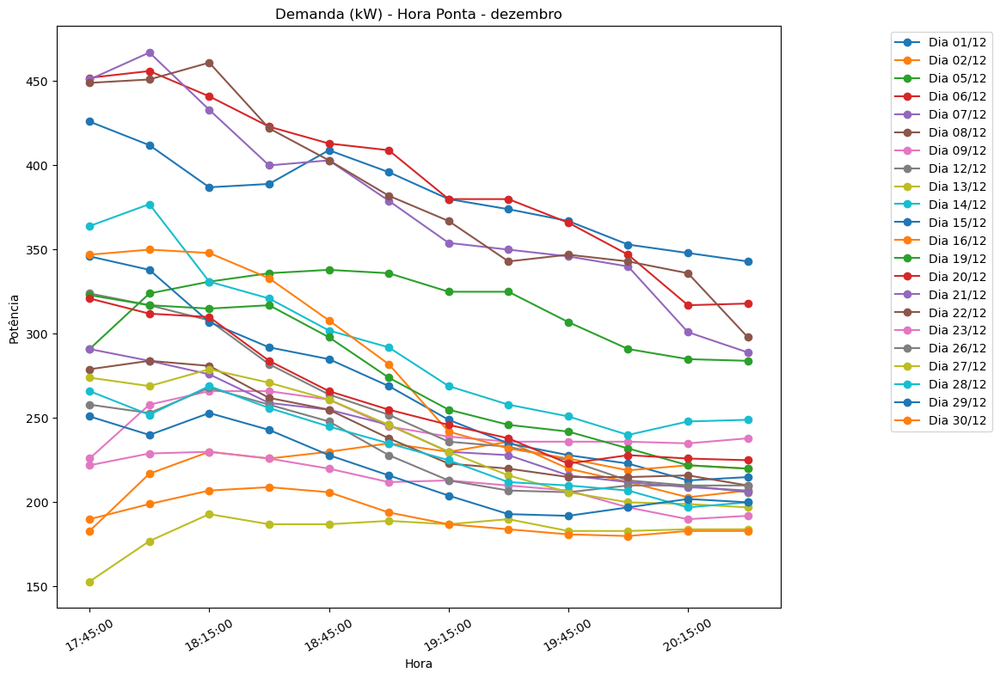

In [20]:
# Filtrar os dados para as datas presentes no df_P
# Filter the data for the dates present in df_P
df_P_dates = df_P['Data'].unique()

plt.figure(figsize=(12,8))

for data_set in df_P_dates:
    data_set = str(data_set)#[:10]
    def_fill = df_P[df_P['Data'] == data_set].copy()
    def_fill['Hora'] = def_fill['Hora'].astype(str)
    
    #Format data:
    formatted_date = pd.to_datetime(data_set).strftime('%d/%m')

    plt.plot(def_fill['Hora'], def_fill['kW'], label=f'Dia {formatted_date}', marker='o', linestyle='-')

plt.xlabel('Hora')
plt.ylabel('Potência')
plt.title(f'Demanda (kW) - Hora Ponta - {mes_nome}')
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
plt.xticks(def_fill['Hora'][::2], rotation=30)

plt.tight_layout()
plt.savefig(f'C:\\Users\\lucas\\Documents\\jupyter_dir_padrao\\eficiencia\\graficosmeses\\{mes_nome}\\DemandaPonta\\DemandaPonta_Total_{mes_nome}.jpg')
plt.show()

In [21]:
len(df_P_dates)

22

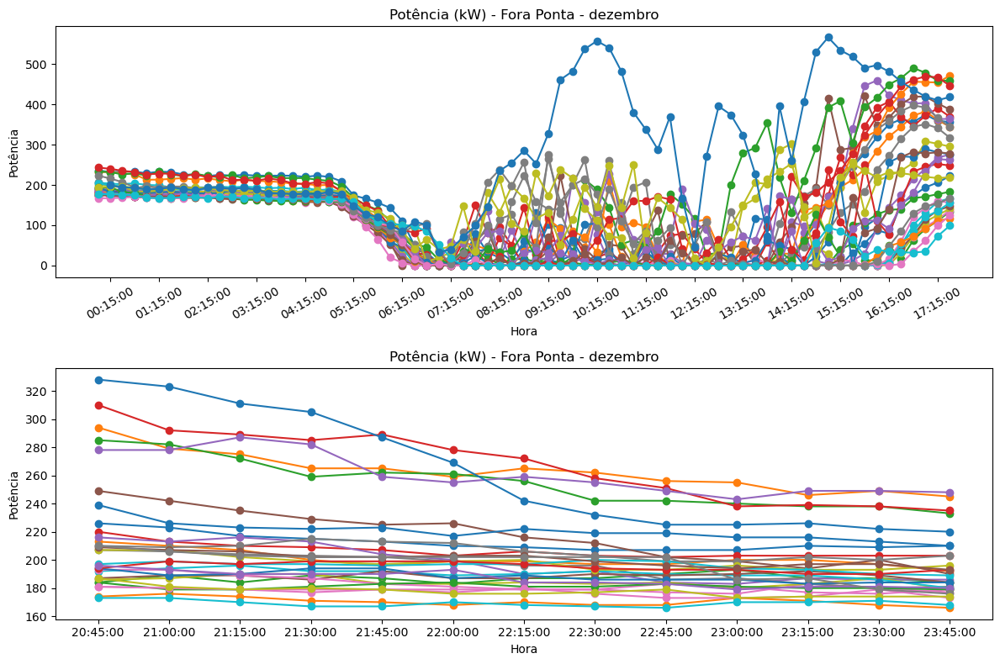

In [22]:
##### ALTERE AS DATAS / ALTER DATES #####

# Filtrar os dados para as datas de cada de 2023 no df_F
# Filter the data for the dates of each of 2023 in df_F
df_F_dates = df_F[df_F['Data'].between('2023-12-01', '2023-12-31')]['Data'].unique()

plt.figure(figsize=(12, 8))

# Primeiro intervalo (00:00 - 17:44)
# First break (00:00 - 17:44)
plt.subplot(2, 1, 1)  
plt.title(f'Potência (kW) - Fora Ponta - {mes_nome}')

for data_set in df_F_dates:
    data_set = str(data_set) 
    def_fill = df_F[df_F['Data'] == data_set].copy()
    def_fill['Hora'] = def_fill['Hora'].astype(str)
    
   
    formatted_date = pd.to_datetime(data_set).strftime('%d/%m')

    # Filtrar os dados para o período fora de ponta
    # Filter data for off-peak period
    def_fill_fora_ponta = def_fill[(def_fill['Hora'] >= '00:00') & (def_fill['Hora'] <= '17:45')]

    
    plt.plot(def_fill_fora_ponta['Hora'], def_fill_fora_ponta['kW'], label=f'Dia {formatted_date}', marker='o', linestyle='-')

plt.xlabel('Hora')
plt.ylabel('Potência')
plt.xticks(def_fill_fora_ponta['Hora'][::4], rotation=30)

# Segundo intervalo (20:31 - 23:59)
# Second break (20:31 - 23:59)
plt.subplot(2, 1, 2) 
plt.title(f'Potência (kW) - Fora Ponta - {mes_nome}')

for data_set in df_F_dates:
    data_set = str(data_set) 
    def_fill = df_F[df_F['Data'] == data_set].copy()
    def_fill['Hora'] = def_fill['Hora'].astype(str)
    

    formatted_date = pd.to_datetime(data_set).strftime('%d/%m')

    # Filtrar os dados para o período fora de ponta
    # Filter data for off-peak period
    def_fill_fora_ponta = def_fill[((def_fill['Hora'] <= '00:00') & (def_fill['Hora'] >= '17:44')) | 
                                  ((def_fill['Hora'] >= '20:31') & (def_fill['Hora'] <= '23:59'))]


    plt.plot(def_fill_fora_ponta['Hora'], def_fill_fora_ponta['kW'], label=f'Dia {formatted_date}', marker='o', linestyle='-')

plt.subplots_adjust(hspace=0.5)    
plt.xlabel('Hora')
plt.ylabel('Potência')


plt.tight_layout()
plt.savefig(f'C:\\Users\\lucas\\Documents\\jupyter_dir_padrao\\eficiencia\\graficosmeses\\{mes_nome}\\DemandaForaPonta\\DemandaForaPonta_Total_{mes_nome}.jpg')
plt.show()


In [23]:
len(df_F_dates)

31

In [24]:
### Encontrar uma curva média que represente o consumo ao longo do dia

## Find an average curve that represents consumption throughout the day

In [25]:
media_por_hora = df.groupby('Hora')['kW'].mean()

In [26]:
media_por_hora

Hora
00:00:00    192.741935
00:15:00    191.322581
00:30:00    189.161290
00:45:00    187.225806
01:00:00    185.225806
               ...    
22:45:00    198.483871
23:00:00    196.838710
23:15:00    196.677419
23:30:00    195.967742
23:45:00    193.870968
Name: kW, Length: 96, dtype: float64

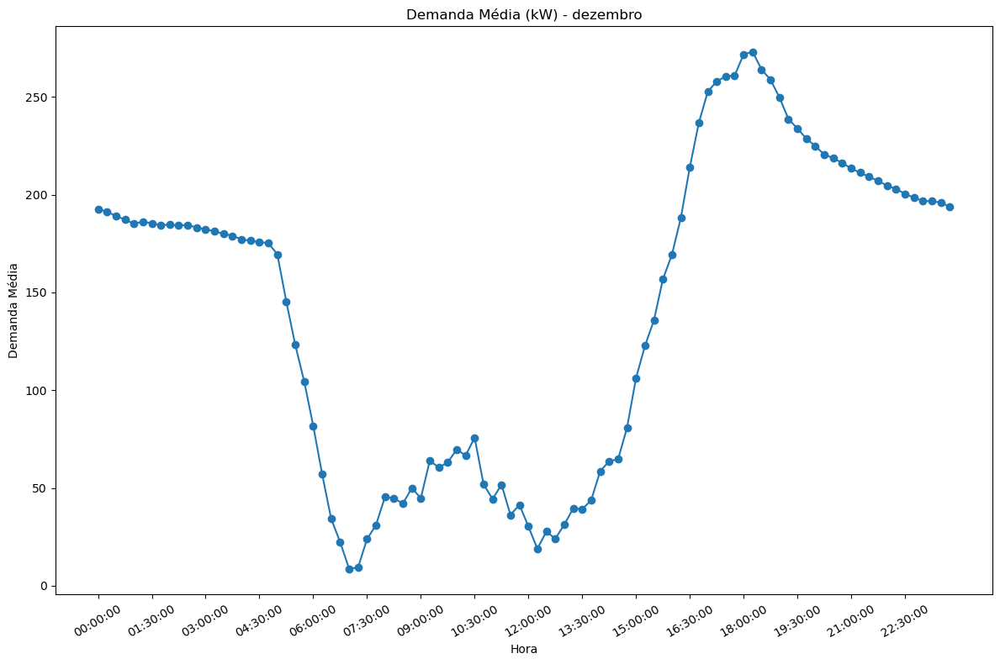

In [27]:
# Obtendo as horas e os valores de kW
# Getting the hours and kW values
horas = media_por_hora.index
media_kW = media_por_hora.values


plt.figure(figsize=(12, 8))
plt.plot(horas, media_kW, marker='o', linestyle='-')


plt.xlabel('Hora')
plt.ylabel('Demanda Média')
plt.title(f'Demanda Média (kW) - {mes_nome}')
plt.xticks(horas[::6], rotation=30)


plt.tight_layout()
plt.savefig(f'C:\\Users\\lucas\\Documents\\jupyter_dir_padrao\\eficiencia\\graficosmeses\\{mes_nome}\\DemandaAtiva\\DemandaAtiva_media_{mes_nome}.jpg')
plt.show()

In [28]:
media_P = df_P.groupby('Hora')['kW'].mean()
media_P

Hora
17:45:00    303.954545
18:00:00    308.318182
18:15:00    305.636364
18:30:00    293.727273
18:45:00    285.681818
19:00:00    273.181818
19:15:00    258.363636
19:30:00    252.090909
19:45:00    245.454545
20:00:00    239.909091
20:15:00    234.363636
20:30:00    231.590909
Name: kW, dtype: float64

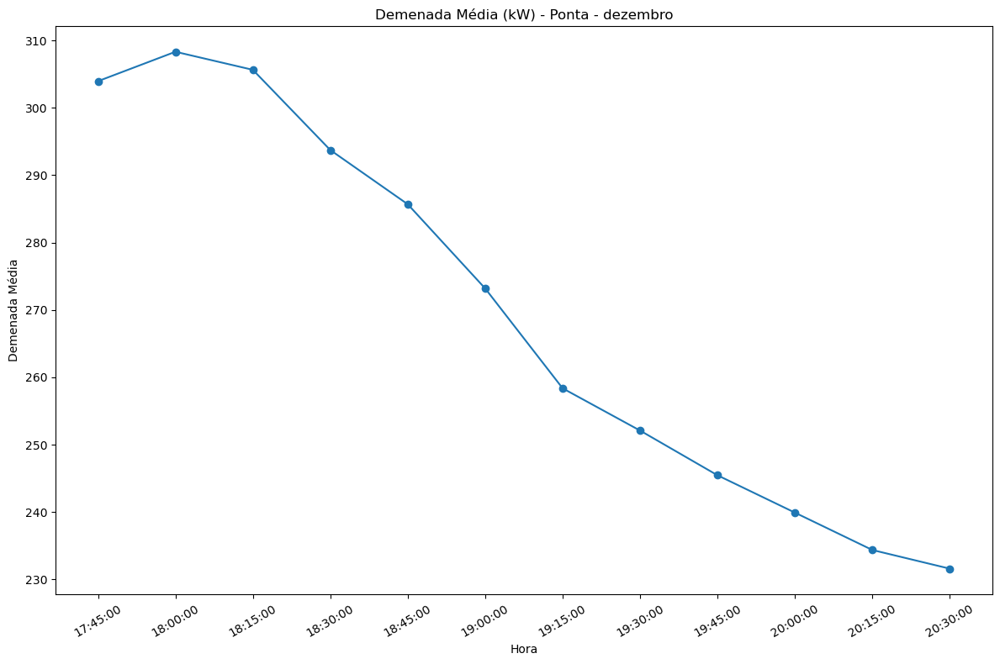

In [29]:
horas_P = media_P.index
media_P_W = media_P.values

plt.figure(figsize=(12, 8))
plt.plot(horas_P, media_P_W, marker='o', linestyle='-')

plt.xlabel('Hora')
plt.ylabel('Demenada Média')
plt.title(f'Demenada Média (kW) - Ponta - {mes_nome}')
plt.xticks(horas_P, rotation=30)

plt.tight_layout()
plt.savefig(f'C:\\Users\\lucas\\Documents\\jupyter_dir_padrao\\eficiencia\\graficosmeses\\{mes_nome}\\DemandaPonta\\DemandaPonta_media_{mes_nome}.jpg')
plt.show()

In [30]:
media_F = df_F.groupby('Hora')['kW'].mean()
media_F

Hora
00:00:00    192.741935
00:15:00    191.322581
00:30:00    189.161290
00:45:00    187.225806
01:00:00    185.225806
               ...    
22:45:00    198.483871
23:00:00    196.838710
23:15:00    196.677419
23:30:00    195.967742
23:45:00    193.870968
Name: kW, Length: 96, dtype: float64

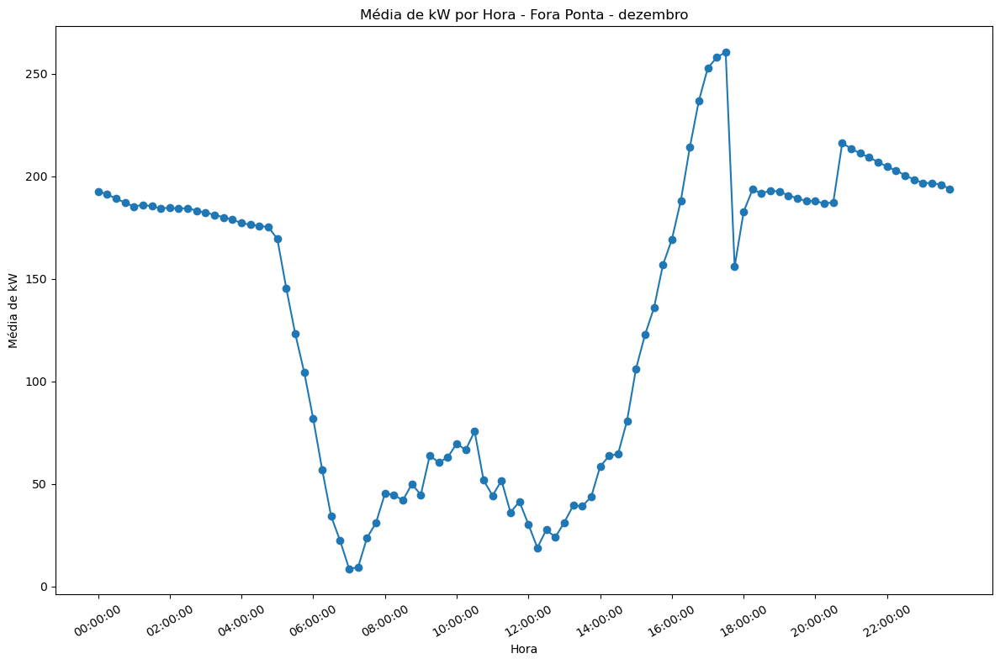

In [31]:
horas_F = media_F.index
media_F_W = media_F.values

plt.figure(figsize=(12, 8))
plt.plot(horas_F, media_F_W, marker='o', linestyle='-')


plt.xlabel('Hora')
plt.ylabel('Média de kW')
plt.title(f'Média de kW por Hora - Fora Ponta - {mes_nome}')
plt.xticks(horas_F[::8], rotation=30)


plt.tight_layout()
plt.savefig(f'C:\\Users\\lucas\\Documents\\jupyter_dir_padrao\\eficiencia\\graficosmeses\\{mes_nome}\\DemandaForaPonta\\DemandaForaPonta_media_{mes_nome}.jpg')
plt.show()

In [64]:
#Mover os arquivos para uma pasta dedicada
#Move files to a dedicated folder
import os
import shutil

# Caminho do diretório base
# Base directory path
base_path = r'C:\Users\lucas\Documents\jupyter_dir_padrao\eficiencia\graficosmeses'

# Criar pasta DemandaAtivaMedia se não existir
# Create DemandaAtivaMedia folder if it does not exist
output_folder = os.path.join(base_path, 'DemandaReativa')
os.makedirs(output_folder, exist_ok=True)


for mes in os.listdir(base_path):
    mes_folder = os.path.join(base_path, mes)
    if os.path.isdir(mes_folder):
        demanda_folder = os.path.join(mes_folder, 'DemandaReativa')
        if os.path.exists(demanda_folder):
           
            file_name = f'ReativoDiarioTotal_{mes}.jpg'
            source_path = os.path.join(demanda_folder, file_name)
            
            # Verificar se o arquivo existe 
            # Check if the file exists 
            if os.path.exists(source_path):
                
                destination_path = os.path.join(output_folder, file_name)
                shutil.copy(source_path, destination_path)
                print(f'Arquivo copiado: {file_name}')
            else:
                print(f'Arquivo não encontrado: {file_name}')

print('Processo concluído.')

Arquivo copiado: ReativoDiarioTotal_abril.jpg
Arquivo copiado: ReativoDiarioTotal_agosto.jpg
Arquivo copiado: ReativoDiarioTotal_dezembro.jpg
Arquivo copiado: ReativoDiarioTotal_fevereiro.jpg
Arquivo copiado: ReativoDiarioTotal_janeiro.jpg
Arquivo copiado: ReativoDiarioTotal_julho.jpg
Arquivo copiado: ReativoDiarioTotal_junho.jpg
Arquivo copiado: ReativoDiarioTotal_maio.jpg
Arquivo copiado: ReativoDiarioTotal_março.jpg
Arquivo copiado: ReativoDiarioTotal_novembro.jpg
Arquivo copiado: ReativoDiarioTotal_outubro.jpg
Arquivo copiado: ReativoDiarioTotal_setembro.jpg
Processo concluído.


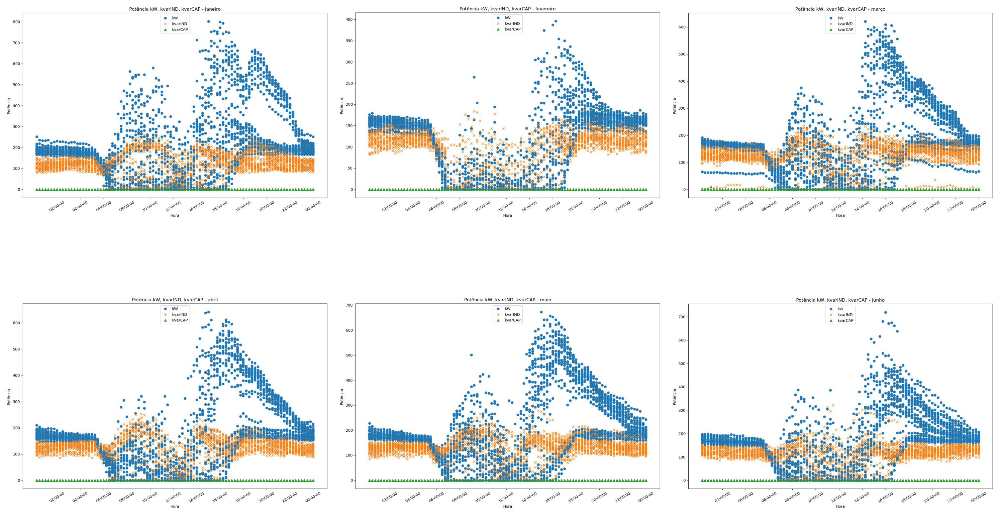

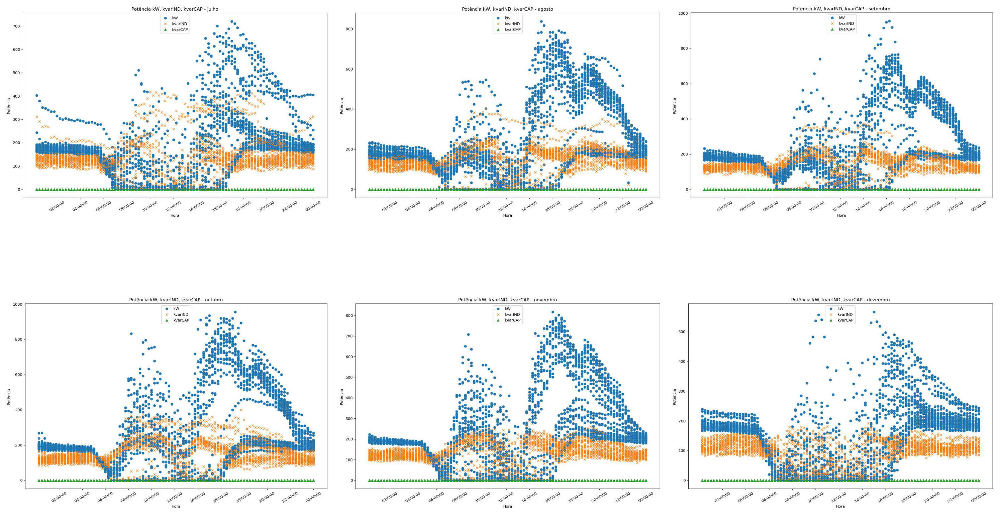

In [65]:
# Unir os gráficos reduzidos para visualizar o todo.
# all in one
import matplotlib.pyplot as plt
import os

# Lista de meses
meses = ['janeiro', 'fevereiro', 'março', 'abril', 'maio', 'junho', 'julho', 'agosto', 'setembro', 'outubro', 'novembro', 'dezembro']

# Caminho base do arquivo
base_path = r'C:\Users\lucas\Documents\jupyter_dir_padrao\eficiencia\graficosmeses\DemandaReativa'

# Definir o número de linhas e colunas
num_linhas = 2
num_colunas = 3

# Criar a primeira figura
plt.figure(figsize=(30, 20))

# Iterar sobre os primeiros 6 meses
for i, mes in enumerate(meses[:6]):
    # Montar o caminho do arquivo
    img_path = os.path.join(base_path, f'ReativoDiarioTotal_{mes}.jpg')
    
    # Adicionar a imagem à figura
    plt.subplot(num_linhas, num_colunas, i+1)
    plt.imshow(plt.imread(img_path))
    plt.axis('off')

# Ajustar o layout
plt.tight_layout()
plt.savefig(r'C:\Users\lucas\Documents\jupyter_dir_padrao\eficiencia\graficosmeses\DemandaReativa\DemandaReativa_2022_parte1.jpg')

# Criar a segunda figura
plt.figure(figsize=(30, 20))

# Iterar sobre os próximos 6 meses
for i, mes in enumerate(meses[6:]):
    # Montar o caminho do arquivo
    img_path = os.path.join(base_path, f'ReativoDiarioTotal_{mes}.jpg')
    
    # Adicionar a imagem à figura
    plt.subplot(num_linhas, num_colunas, i+1)
    plt.imshow(plt.imread(img_path))
    plt.axis('off')
    
# Ajustar o layout
plt.tight_layout()
plt.savefig(r'C:\Users\lucas\Documents\jupyter_dir_padrao\eficiencia\graficosmeses\DemandaReativa\DemandaReativa_2022_parte2.jpg')
